In [3]:
from tqdm import tqdm
import importlib

import data_processing
from data_processing import extract_features

importlib.reload(data_processing)

count_tracks = data_processing.count_tracks
process_slice_to_df = data_processing.process_slice_to_df

df1 = None

for i in tqdm(range(1000)):
    file_path = f"spotify_million_playlist_dataset/data/mpd.slice.{i * 1000}-{i * 1000 + 999}.json"
    df1 = process_slice_to_df(file_path, df1)

100%|██████████| 1000/1000 [02:43<00:00,  6.13it/s]


In [5]:
df1.describe()

,modified_at,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists
count,1.000000e+06,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1.000000e+06,1000000.000000
mean,1.476279e+09,66.346428,49.597278,2.597746,17.655902,1.557968e+07,38.088211
std,3.666992e+07,53.669358,39.961064,128.851145,20.643254,1.285643e+07,30.282901
min,1.271376e+09,5.000000,2.000000,1.000000,1.000000,9.753800e+04,3.000000
25%,1.458950e+09,26.000000,20.000000,1.000000,5.000000,5.995383e+06,16.000000
50%,1.490227e+09,49.000000,37.000000,1.000000,10.000000,1.142244e+07,29.000000
75%,1.505434e+09,92.000000,68.000000,1.000000,22.000000,2.143369e+07,52.000000
max,1.509494e+09,376.000000,244.000000,71643.000000,201.000000,6.350738e+08,238.000000


In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 11 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   name           1000000 non-null  object
 1   collaborative  1000000 non-null  bool  
 2   modified_at    1000000 non-null  uint32
 3   num_tracks     1000000 non-null  uint16
 4   num_albums     1000000 non-null  uint8 
 5   num_followers  1000000 non-null  uint32
 6   tracks         1000000 non-null  object
 7   num_edits      1000000 non-null  uint8 
 8   duration_ms    1000000 non-null  uint32
 9   num_artists    1000000 non-null  uint8 
 10  description    1000000 non-null  bool  
dtypes: bool(2), object(2), uint16(1), uint32(3), uint8(3)
memory usage: 33.4+ MB


In [7]:
df1

,name,collaborative,modified_at,num_tracks,num_albums,num_followers,tracks,num_edits,duration_ms,num_artists,description
0,Throwbacks,False,1493424000,52,47,1,[Lose Control (feat. Ciara & Fat Man Scoop) by...,6,11532414,37,False
1,Awesome Playlist,False,1506556800,39,23,1,"[Eye of the Tiger by Survivor, Libera Me From ...",5,11656470,21,False
2,korean,False,1505692800,64,51,1,"[Like You by Hoody, GOOD (feat. ELO) by Loco, ...",18,14039958,31,False
3,mat,False,1501027200,126,107,1,"[Danse macabre by Camille Saint-Saëns, Piano c...",4,28926058,86,False
4,90s,False,1401667200,17,16,2,"[Tonight, Tonight by The Smashing Pumpkins, Wo...",7,4335282,16,False
...,...,...,...,...,...,...,...,...,...,...,...
999995,Praise,False,1409529600,32,23,1,"[Who You Are by Unspoken, Something Beautiful ...",5,8502173,11,False
999996,Worship,False,1475625600,122,74,1,[Until The Sun - Pax217 Album Version by Pax21...,12,31246908,42,False
999997,Sex,False,1498176000,24,22,1,"[You by Romeo Santos, El Malo by Aventura, La ...",4,6015165,17,False
999998,✝️,False,1506816000,11,8,1,[Oceans (Where Feet May Fail) by Hillsong Unit...,6,2909608,5,False


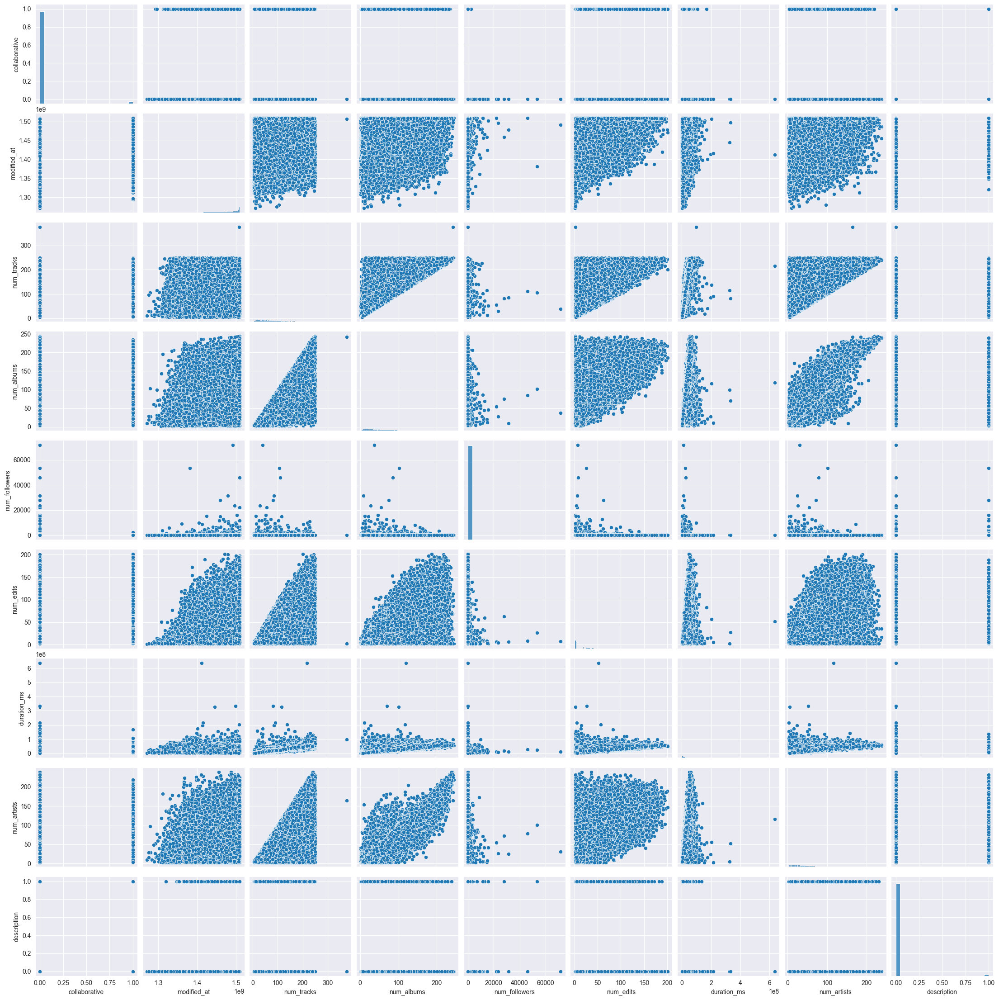

In [9]:
import seaborn as sns

pairplot1 = sns.pairplot(df1)

# Save the pairplot as an image
pairplot1.savefig("pairplot1_output.png")

In [104]:
import importlib

import data_processing
import data_normalizer
importlib.reload(data_processing)
importlib.reload(data_normalizer)

count_tracks = data_processing.count_tracks
process_slice_to_df = data_processing.process_slice_to_df
extract_features = data_processing.extract_features
DataNormalizer = data_normalizer.DataNormalizer

In [80]:
from tqdm import tqdm

df = None

for i in tqdm(range(800)):
    file_path = f"spotify_million_playlist_dataset/data/mpd.slice.{i * 1000}-{i * 1000 + 999}.json"
    df = process_slice_to_df(file_path, df)

100%|██████████| 800/800 [05:33<00:00,  2.40it/s]  


In [81]:
test_df = None

for i in tqdm(range(800, 1000)):
    file_path = f"spotify_million_playlist_dataset/data/mpd.slice.{i * 1000}-{i * 1000 + 999}.json"
    test_df = process_slice_to_df(file_path, test_df)

100%|██████████| 200/200 [02:46<00:00,  1.20it/s] 


In [82]:
memory_usage = df.memory_usage(deep=True)  # Memory usage per column
total_memory = df.memory_usage(deep=True).sum()  # Total memory usage

print(memory_usage)
print(f"Total memory usage: {total_memory} bytes")
total_memory_mb = total_memory / (1024 ** 2)
print(f"Total memory usage: {total_memory_mb:.2f} MB")

Index                           132
collaborative                800000
modified_at                 3200000
num_followers               3200000
tracks                    516008384
num_edits                    800000
num_artists                  800000
description                  800000
avg_albums_per_artist       3200000
avg_tracks_per_album        3200000
avg_duration_per_track      6400000
dtype: int64
Total memory usage: 538408516 bytes
Total memory usage: 513.47 MB


In [83]:
song_counts, total_songs = count_tracks(df['tracks'], None, 0)
song_counts.most_common(5), total_songs

([('HUMBLE. by Kendrick Lamar', 37110),
  ('One Dance by Drake', 34674),
  ('Broccoli (feat. Lil Yachty) by DRAM', 32988),
  ('Closer by The Chainsmokers', 32926),
  ('Congratulations by Post Malone', 31885)],
 53042720)

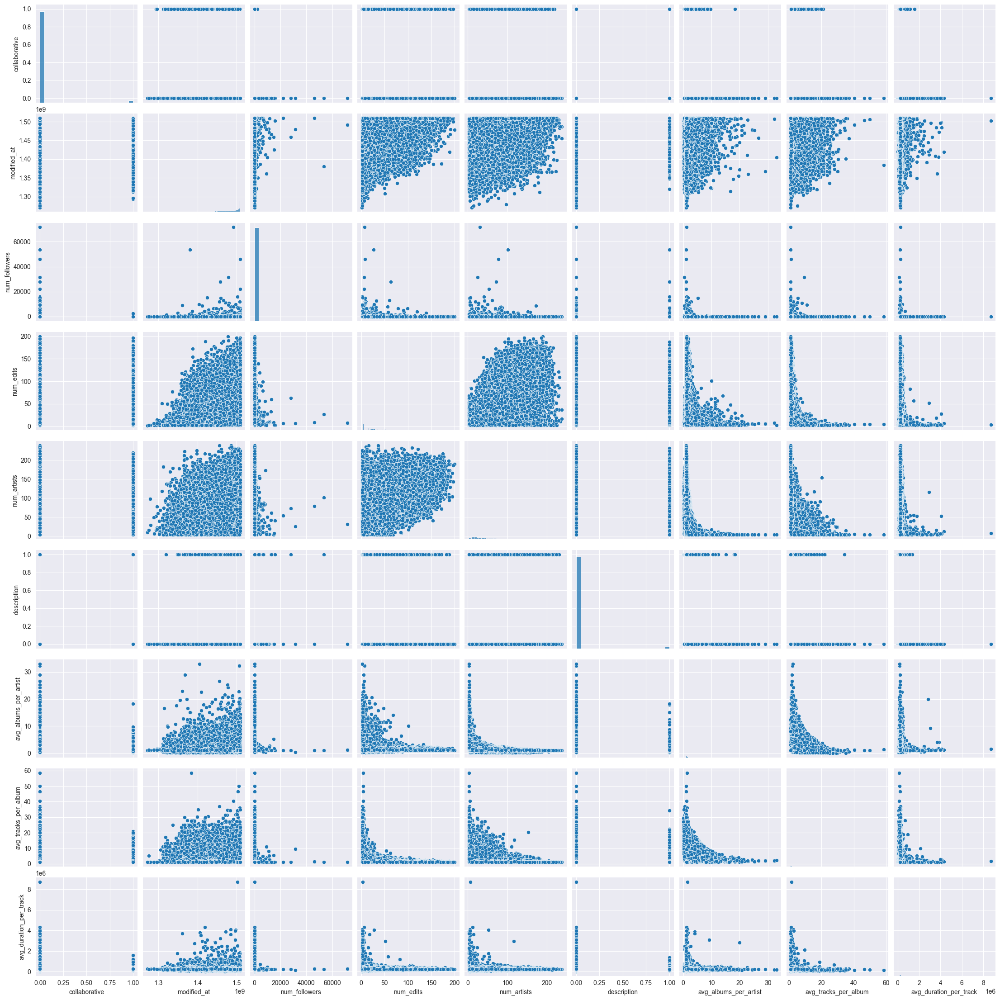

In [84]:
import seaborn as sns

pairplot = sns.pairplot(df)

# Save the pairplot as an image
pairplot.savefig("pairplot_output.png")

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800000 entries, 0 to 799999
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   collaborative           800000 non-null  bool   
 1   modified_at             800000 non-null  uint32 
 2   num_followers           800000 non-null  uint32 
 3   tracks                  800000 non-null  object 
 4   num_edits               800000 non-null  uint8  
 5   num_artists             800000 non-null  uint8  
 6   description             800000 non-null  bool   
 7   avg_albums_per_artist   800000 non-null  float32
 8   avg_tracks_per_album    800000 non-null  float32
 9   avg_duration_per_track  800000 non-null  float64
dtypes: bool(2), float32(2), float64(1), object(1), uint32(2), uint8(2)
memory usage: 27.5+ MB


In [86]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import numpy as np

columns_for_vif = [
    'modified_at', 'num_followers', 'num_edits', 'num_artists',
    'avg_albums_per_artist', 'avg_tracks_per_album', 'avg_duration_per_track'
]
X = add_constant(df[columns_for_vif])  # Add constant for intercept

# Calculate VIF for each specified column, excluding the constant
vif = pd.DataFrame()
vif['Feature'] = X.columns
vif['VIF'] = [
    variance_inflation_factor(X.values, i) if i > 0 else np.nan  # Set const VIF to NaN
    for i in range(X.shape[1])
]

print(vif)

                  Feature       VIF
0                   const       NaN
1             modified_at  1.079415
2           num_followers  1.000047
3               num_edits  1.839412
4             num_artists  1.846065
5   avg_albums_per_artist  1.074192
6    avg_tracks_per_album  1.087148
7  avg_duration_per_track  1.015958


In [87]:
df.to_feather('df.feather')

In [88]:
test_df.to_feather('test_df.feather')

In [89]:
edf = pd.read_feather('df.feather')

In [90]:
test_edf = pd.read_feather('test_df.feather')

In [44]:
song_counts, total_songs = count_tracks(edf['tracks'], None, 0)
song_counts.most_common(5), total_songs

([('HUMBLE. by Kendrick Lamar', 46528),
  ('One Dance by Drake', 43402),
  ('Broccoli (feat. Lil Yachty) by DRAM', 41269),
  ('Closer by The Chainsmokers', 41034),
  ('Congratulations by Post Malone', 39954)],
 66282378)

In [93]:
extract_features = data_processing.extract_features

edf = extract_features(edf, song_counts, total_songs)
edf

,collaborative,modified_at,num_followers,tracks,num_edits,num_artists,description,avg_albums_per_artist,avg_tracks_per_album,avg_duration_per_track,popularity_score,avg_song_popularity,top_songs_count,top_artists_count,diversity_score,rarity_score,unique_artists
0,False,1493424000,1,[Lose Control (feat. Ciara & Fat Man Scoop) by...,6,37,False,1.270270,1.106383,221777.192308,51.930910,0.998671,5,11,51,51.993084,37
1,False,1506556800,1,"[Eye of the Tiger by Survivor, Libera Me From ...",5,21,False,1.095238,1.695652,298883.846154,38.969288,0.999213,2,3,39,38.996926,21
2,False,1505692800,1,"[Like You by Hoody, GOOD (feat. ELO) by Loco, ...",18,31,False,1.645161,1.254902,219374.343750,63.997600,0.999962,0,0,64,63.999760,31
3,False,1501027200,1,"[Danse macabre by Camille Saint-Saëns, Piano c...",4,86,False,1.244186,1.177570,229571.888889,125.993428,0.999948,0,0,126,125.999343,86
4,False,1401667200,2,"[Tonight, Tonight by The Smashing Pumpkins, Wo...",7,16,False,1.000000,1.062500,255016.588235,16.989162,0.999362,0,0,17,16.998916,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799995,False,1493942400,1,"[Traveller by Chris Stapleton, Fire Away by Ch...",5,4,False,3.000000,6.083333,226612.041096,72.994474,0.999924,0,0,73,72.999447,4
799996,False,1507939200,2,"[Stop by Jane's Addiction, Unchained by Van Ha...",67,71,False,1.225352,1.126437,232870.530612,97.925023,0.999235,2,13,97,97.992496,71
799997,True,1436659200,2,"[White Noise by Disclosure, Hella Hoes by A$AP...",15,60,False,1.433333,1.162791,260769.140000,99.928093,0.999281,3,26,99,99.992803,59
799998,False,1509235200,1,"[La Vie En Rose by Cristin Milioti, Water by J...",8,21,False,1.142857,1.083333,219270.307692,25.983634,0.999371,0,5,26,25.998362,21


In [94]:
test_edf = extract_features(test_edf, song_counts, total_songs)
test_edf

,collaborative,modified_at,num_followers,tracks,num_edits,num_artists,description,avg_albums_per_artist,avg_tracks_per_album,avg_duration_per_track,popularity_score,avg_song_popularity,top_songs_count,top_artists_count,diversity_score,rarity_score,unique_artists
0,False,1452038400,2,"[Tennessee Love by Yelawolf, Over & Over by Ju...",2,30,False,1.000000,1.000000,240678.433333,28.996789,0.966560,0,1,30,29.999679,30
1,False,1509321600,1,"[Smile by PnB Rock, Dreams by NERO, Oh That I ...",8,96,False,1.104167,1.094340,254598.982759,112.988523,0.974039,0,2,115,115.998852,96
2,False,1488844800,1,"[Bounce Back by Big Sean, Chill Bill by Rob $t...",3,8,False,1.125000,1.111111,237315.500000,9.975682,0.997568,4,5,10,9.997564,8
3,False,1422576000,1,"[Renegade by Styx, You Give Love A Bad Name by...",12,17,False,1.294118,1.181818,280412.807692,25.972820,0.998955,0,1,25,25.997280,17
4,False,1436486400,1,[Unprotected Sex with Multiple Partners by Aga...,32,57,False,1.543860,1.147727,217682.653465,100.973988,0.999742,1,6,100,100.997397,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,False,1409529600,1,"[Who You Are by Unspoken, Something Beautiful ...",5,11,False,2.090909,1.391304,265692.906250,31.996134,0.999879,0,0,31,31.999613,11
199996,False,1475625600,1,[Until The Sun - Pax217 Album Version by Pax21...,12,42,False,1.761905,1.648649,256122.196721,112.987740,0.926129,0,0,121,121.998774,42
199997,False,1498176000,1,"[You by Romeo Santos, El Malo by Aventura, La ...",4,17,False,1.294118,1.090909,250631.875000,23.981116,0.999213,1,5,24,23.998109,17
199998,False,1506816000,1,[Oceans (Where Feet May Fail) by Hillsong Unit...,6,5,False,1.600000,1.375000,264509.818182,10.996681,0.999698,0,0,10,10.999668,5


In [96]:
del edf['tracks']
del test_edf['tracks']

In [97]:
print(edf.describe())

        modified_at  num_followers      num_edits    num_artists  \
count  8.000000e+05  800000.000000  800000.000000  800000.000000   
mean   1.476291e+09       2.669671      17.645426      38.063741   
std    3.666196e+07     139.729551      20.625162      30.269273   
min    1.271376e+09       1.000000       1.000000       3.000000   
25%    1.459037e+09       1.000000       5.000000      16.000000   
50%    1.490227e+09       1.000000      10.000000      29.000000   
75%    1.505434e+09       1.000000      22.000000      52.000000   
max    1.509494e+09   71643.000000     200.000000     238.000000   

       avg_albums_per_artist  avg_tracks_per_album  avg_duration_per_track  \
count          800000.000000         800000.000000            8.000000e+05   
mean                1.355364              1.478637            2.351082e+05   
std                 0.544502              1.224928            3.957398e+04   
min                 0.050000              1.000000            1.950760e+04 

In [105]:
# List of numeric columns to normalize
columns_to_normalize = [
    'modified_at', 'num_followers', 'num_edits', 'num_artists',
    'avg_albums_per_artist', 'avg_tracks_per_album', 'avg_duration_per_track',
    'popularity_score', 'avg_song_popularity', 'top_songs_count',
    'top_artists_count', 'diversity_score', 'rarity_score', 'unique_artists'
]

# List of columns to log-transform before normalization
log_transform_columns = [
    'num_followers', 'num_edits', 'diversity_score',
    'rarity_score', 'top_artists_count', 'unique_artists'
]

# Initialize the normalizer
normalizer = DataNormalizer(
    columns_to_normalize=columns_to_normalize,
    log_transform_columns=log_transform_columns
)

# Fit and transform the training data
normalized_train_edf = normalizer.fit_transform(edf)

# Transform the test data using the same normalizer
normalized_test_edf = normalizer.transform(test_edf)

# Reverse transform for predictions
reversed_edf = normalizer.inverse_transform(normalized_test_edf)

# Check results
print(normalized_train_edf.head())
print(reversed_edf.head())

   modified_at  num_followers  num_edits  num_artists  avg_albums_per_artist  \
0     0.467319      -0.432170  -0.570362    -0.035143              -0.156278   
1     0.825532      -0.432170  -0.736735    -0.563732              -0.477732   
2     0.801965      -0.432170   0.507338    -0.233364               0.532225   
3     0.674705      -0.432170  -0.933513     1.583662              -0.204183   
4    -2.035462       0.674132  -0.426243    -0.728916              -0.652641   

   avg_tracks_per_album  avg_duration_per_track  popularity_score  \
0             -0.303898               -0.336863         -0.267349   
1              0.177166                1.611556         -0.509210   
2             -0.182651               -0.397581         -0.042187   
3             -0.245783               -0.139898          1.114643   
4             -0.339723                0.503068         -0.919355   

   avg_song_popularity  top_songs_count  top_artists_count  diversity_score  \
0            -1.069503   

In [112]:
memory_usage = normalized_train_edf.memory_usage(deep=True)  # Memory usage per column
total_memory = normalized_train_edf.memory_usage(deep=True).sum()  # Total memory usage

print(memory_usage)
print(f"Total memory usage: {total_memory} bytes")
total_memory_mb = total_memory / (1024 ** 2)
print(f"Total memory usage: {total_memory_mb:.2f} MB")

Index                         132
modified_at               6400000
num_followers             6400000
num_edits                 6400000
num_artists               6400000
avg_albums_per_artist     6400000
avg_tracks_per_album      6400000
avg_duration_per_track    6400000
popularity_score          6400000
avg_song_popularity       6400000
top_songs_count           6400000
top_artists_count         6400000
diversity_score           6400000
rarity_score              6400000
unique_artists            6400000
collaborative              800000
description                800000
dtype: int64
Total memory usage: 91200132 bytes
Total memory usage: 86.98 MB


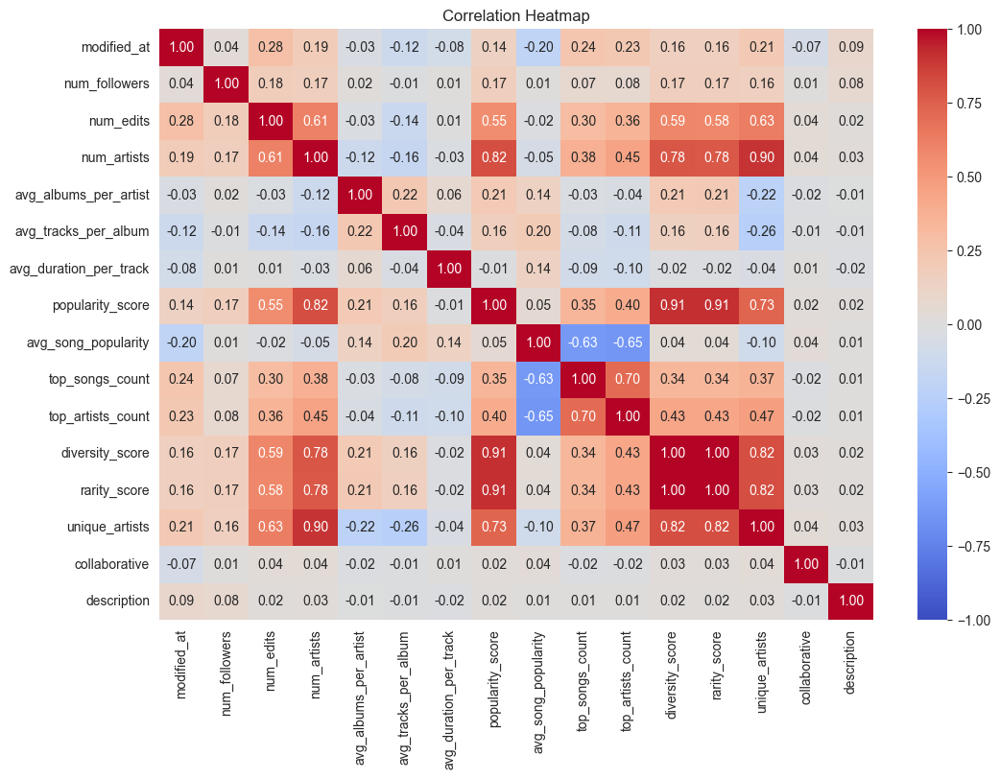

In [119]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
correlation_matrix = normalized_train_edf.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Heatmap")
plt.show()

In [136]:
del normalized_train_edf['rarity_score']
del normalized_test_edf['rarity_score']
del normalized_train_edf['unique_artists']
del normalized_test_edf['unique_artists']
del normalized_train_edf['diversity_score']
del normalized_test_edf['diversity_score']

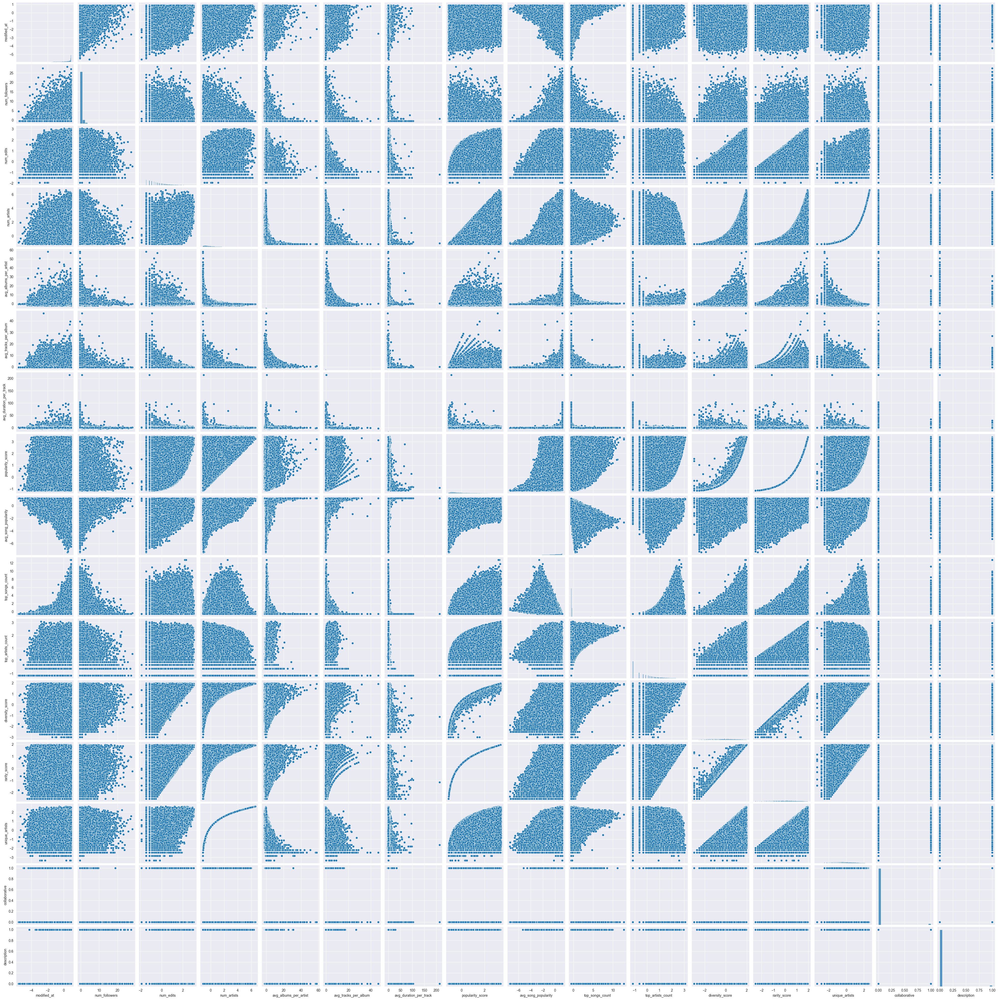

In [108]:
normalized_pairplot = sns.pairplot(normalized_train_edf)

# Save the pairplot as an image
normalized_pairplot.savefig("normalized_pairplot_output.png")

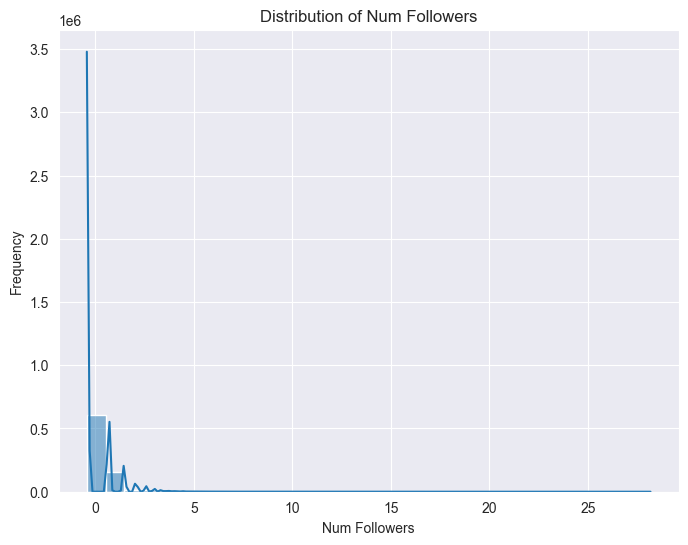

In [123]:
plt.figure(figsize=(8, 6))
sns.histplot(normalized_train_edf['num_followers'], kde=True, bins=30)
plt.title("Distribution of Num Followers")
plt.xlabel("Num Followers")
plt.ylabel("Frequency")
plt.show()

In [125]:
correlation_with_target = normalized_train_edf.corr()['num_followers'].sort_values(ascending=False)
print("Correlation with log_num_followers:")
print(correlation_with_target)

Correlation with log_num_followers:
num_followers             1.000000
num_edits                 0.177217
num_artists               0.166296
diversity_score           0.165820
popularity_score          0.165180
description               0.077373
top_artists_count         0.076628
top_songs_count           0.072313
modified_at               0.038140
avg_albums_per_artist     0.020498
collaborative             0.013915
avg_song_popularity       0.012299
avg_duration_per_track    0.008632
avg_tracks_per_album     -0.010114
Name: num_followers, dtype: float64


In [138]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Define selected features
selected_features = ['num_edits', 'num_artists', 'popularity_score', 'description', 'top_artists_count', 'top_songs_count', 'modified_at', 'avg_albums_per_artist', 'collaborative', 'avg_song_popularity']

# Subset the data for VIF calculation
X = normalized_train_edf[selected_features]

X.loc[:, 'description'] = X['description'].apply(lambda x: 1 if x == True else 0)
X.loc[:, 'collaborative'] = X['collaborative'].apply(lambda x: 1 if x == True else 0)

# Handle NaN and infinite values
X = X.replace([np.inf, -np.inf], np.nan).dropna()

# Calculate VIF
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

/var/folders/_1/gbh7tm8j7tn3yvh79xv0w95m0000gn/T/ipykernel_65279/1915451159.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 0 0 ... 0 0 0]' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.
  X.loc[:, 'description'] = X['description'].apply(lambda x: 1 if x == True else 0)
/var/folders/_1/gbh7tm8j7tn3yvh79xv0w95m0000gn/T/ipykernel_65279/1915451159.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 0 0 ... 1 0 0]' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.
  X.loc[:, 'collaborative'] = X['collaborative'].apply(lambda x: 1 if x == True else 0)


                 Feature       VIF
0              num_edits  1.756737
1            num_artists  4.664412
2       popularity_score  4.690824
3            description  1.009861
4      top_artists_count  2.949436
5        top_songs_count  2.423386
6            modified_at  1.150748
7  avg_albums_per_artist  1.444500
8          collaborative  1.010456
9    avg_song_popularity  2.673338


In [140]:
y = normalized_train_edf['num_followers']

In [141]:
X['description'] = X['description'].astype(bool)
X['collaborative'] = X['collaborative'].astype(bool)
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800000 entries, 0 to 799999
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   num_edits              800000 non-null  float64
 1   num_artists            800000 non-null  float64
 2   popularity_score       800000 non-null  float64
 3   description            800000 non-null  bool   
 4   top_artists_count      800000 non-null  float64
 5   top_songs_count        800000 non-null  float64
 6   modified_at            800000 non-null  float64
 7   avg_albums_per_artist  800000 non-null  float64
 8   collaborative          800000 non-null  bool   
 9   avg_song_popularity    800000 non-null  float64
dtypes: bool(2), float64(8)
memory usage: 50.4 MB


In [150]:
final_train = X
final_train['num_followers'] = y
final_train.to_feather("final_train.feather")

In [151]:
normalized_train_edf.to_feather("normalized_train_edf.feather")
normalized_test_edf.to_feather("normalized_test_edf.feather")

In [143]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

def find_best_regression_model(X_train, y_train, scoring='r2', cv=5):
    """
    Perform grid search to find the best regression model among OLS, Ridge, and Lasso.

    Args:
        X_train (pd.DataFrame): Feature matrix for training.
        y_train (pd.Series): Target variable for training.
        scoring (str): Scoring metric to optimize. Default is 'r2'.
        cv (int): Number of cross-validation folds. Default is 5.

    Returns:
        dict: Best model, parameters, and evaluation metrics.
    """
    # Define parameter grids
    ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
    lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}

    # Initialize models
    ols = LinearRegression()
    ridge = Ridge()
    lasso = Lasso(max_iter=10000)

    # Perform grid search for Ridge
    ridge_search = GridSearchCV(ridge, param_grid=ridge_params, scoring=scoring, cv=cv)
    ridge_search.fit(X_train, y_train)

    # Perform grid search for Lasso
    lasso_search = GridSearchCV(lasso, param_grid=lasso_params, scoring=scoring, cv=cv)
    lasso_search.fit(X_train, y_train)

    # Fit OLS without hyperparameters
    ols.fit(X_train, y_train)
    ols_r2 = r2_score(y_train, ols.predict(X_train))
    ols_mse = mean_squared_error(y_train, ols.predict(X_train))

    # Collect results
    results = {
        'OLS': {
            'Model': ols,
            'Best Params': None,
            'R^2': ols_r2,
            'MSE': ols_mse
        },
        'Ridge': {
            'Model': ridge_search.best_estimator_,
            'Best Params': ridge_search.best_params_,
            'R^2': ridge_search.best_score_,
            'MSE': mean_squared_error(y_train, ridge_search.best_estimator_.predict(X_train))
        },
        'Lasso': {
            'Model': lasso_search.best_estimator_,
            'Best Params': lasso_search.best_params_,
            'R^2': lasso_search.best_score_,
            'MSE': mean_squared_error(y_train, lasso_search.best_estimator_.predict(X_train))
        }
    }

    # Identify the best model
    best_model = max(results, key=lambda x: results[x]['R^2'])
    results['Best Model'] = best_model

    return results

In [144]:
# Call the function with training data
results = find_best_regression_model(X, y)

# Print the best model and its parameters
print(f"Best Model: {results['Best Model']}")
print(f"Best Parameters: {results[results['Best Model']]['Best Params']}")
print(f"R^2: {results[results['Best Model']]['R^2']}")
print(f"MSE: {results[results['Best Model']]['MSE']}")

Best Model: OLS
Best Parameters: None
R^2: 0.0443991027446462
MSE: 0.9556008972553535


In [145]:
import numpy as np

y_log_transformed = np.log1p(y)  # Apply log(1 + y) to handle zeros

In [147]:
# Call the function with training data
results2 = find_best_regression_model(X, y_log_transformed)

# Retrieve the best model's results
best_model = results2['Best Model']
best_params = results2[best_model]['Best Params']
best_r2 = results2[best_model]['R^2']
best_mse = results2[best_model]['MSE']

# Interpret the results
print(f"The best model after log-transforming the target variable (y) is: {best_model}.")
if best_params:
    print(f"Optimal hyperparameters for the best model: {best_params}")
else:
    print(f"The {best_model} model does not have hyperparameters to optimize.")

print(f"R^2 (on log-transformed y): {best_r2:.4f}")
print(f"MSE (on log-transformed y): {best_mse:.4f}")

The best model after log-transforming the target variable (y) is: OLS.
The OLS model does not have hyperparameters to optimize.
R^2 (on log-transformed y): 0.0533
MSE (on log-transformed y): 0.3394

Interpretation:
R^2 represents the proportion of variance explained by the model in the log-transformed target.
MSE indicates the average squared error between the predicted and actual log-transformed values.
These metrics are based on the transformed target variable. To interpret predictions in the original scale, you must exponentiate the predicted values (e.g., using np.expm1).


In [61]:
import numpy as np

# Add a log-transformed 'num_followers' column
test_df['log_num_followers'] = np.log1p(test_df['num_followers'])  # log1p handles log(0) gracefully

# Calculate average log-transformed followers for collaborative and non-collaborative playlists
avg_log_followers_collaborative = test_df[test_df['collaborative']]['log_num_followers'].mean()
avg_log_followers_non_collaborative = test_df[~test_df['collaborative']]['log_num_followers'].mean()

# Exponentiate the log-averages back to original scale
avg_followers_collaborative = np.expm1(avg_log_followers_collaborative)
avg_followers_non_collaborative = np.expm1(avg_log_followers_non_collaborative)

print(f"Average followers for collaborative playlists (log-transformed): {avg_followers_collaborative:.2f}")
print(f"Average followers for non-collaborative playlists (log-transformed): {avg_followers_non_collaborative:.2f}")

Average followers for collaborative playlists (log-transformed): 1.42
Average followers for non-collaborative playlists (log-transformed): 1.34


In [62]:
from scipy.stats import ttest_ind

collaborative_group = test_df[test_df['collaborative']]['log_num_followers']
non_collaborative_group = test_df[~test_df['collaborative']]['log_num_followers']

t_stat, p_value = ttest_ind(collaborative_group, non_collaborative_group, equal_var=False)
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")
if p_value < 0.05:
    print("The difference in followers is statistically significant.")
else:
    print("The difference in followers is not statistically significant.")

T-statistic: 14.0806, P-value: 0.0000
The difference in followers is statistically significant.


In [69]:
from scipy.stats import ttest_ind
import pandas as pd

def analyze_features_with_ttests(df, target):
    """
    Analyze features by showing the relationship with the target and performing t-tests.

    Args:
        df (pd.DataFrame): The dataset with features and target variable.
        target (str): The name of the target variable.

    Returns:
        pd.DataFrame: Summary of t-test results with feature name, relationship, t-statistic, and p-value.
    """
    results = []

    for column in df.columns:
        if column == target or column == 'tracks':  # Skip target and 'tracks' column
            continue

        # Check if column is binary (bool or 2 unique values)
        if pd.api.types.is_bool_dtype(df[column]) or df[column].nunique() == 2:
            group1 = df[df[column] == df[column].unique()[0]][target]
            group2 = df[df[column] == df[column].unique()[1]][target]

        elif pd.api.types.is_numeric_dtype(df[column]):
            # For numeric features, group into high/low based on median
            median_value = df[column].median()
            group1 = df[df[column] >= median_value][target]
            group2 = df[df[column] < median_value][target]

        else:
            # Skip non-supported columns
            continue

        # Check group sizes
        if len(group1) < 10 or len(group2) < 10:
            print(f"Skipping t-test for {column}: insufficient group size")
            continue

        # Perform t-test
        t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

        # Append results
        results.append({
            'Feature': column,
            'T-Statistic': t_stat,
            'P-Value': p_value
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)
    return results_df.sort_values(by='P-Value')

# Run the analysis
t_test_results = analyze_features_with_ttests(test_df.drop(columns=['tracks']), target='num_followers')
print(t_test_results)

Skipping t-test for coverage: insufficient group size
Skipping t-test for log_num_followers: insufficient group size
                   Feature  T-Statistic       P-Value
0            collaborative     5.015057  5.308082e-07
8         popularity_score     4.247589  2.161035e-05
13            rarity_score     4.247589  2.161035e-05
12         diversity_score     4.124101  3.722173e-05
4              description    -3.409251  6.527840e-04
9      avg_song_popularity     3.400702  6.721582e-04
14          unique_artists     3.024198  2.493011e-03
3              num_artists     3.022870  2.503982e-03
10         top_songs_count    -2.246663  2.466179e-02
11       top_artists_count    -1.508931  1.313167e-01
5    avg_albums_per_artist    -1.283099  1.994580e-01
2                num_edits     0.832168  4.053145e-01
7   avg_duration_per_track    -0.642167  5.207648e-01
6     avg_tracks_per_album    -0.305269  7.601612e-01
1              modified_at    -0.209425  8.341161e-01


In [72]:
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Prepare the data
features_to_drop = ['log_num_followers', 'num_followers', 'tracks']  # Target variable
X = test_df.drop(columns=features_to_drop)
y = test_df['log_num_followers']

# Optional: Scale the data for Lasso regression
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train LassoCV for feature selection
lasso = LassoCV(cv=5, random_state=42).fit(X_train, y_train)

# Display the optimal alpha
print(f"Optimal alpha (regularization strength): {lasso.alpha_}")

# Get the coefficients of the features
feature_importance = pd.DataFrame({
    'Feature': test_df.drop(columns=features_to_drop).columns,
    'Coefficient': lasso.coef_
})

# Filter non-zero coefficients
selected_features = feature_importance[feature_importance['Coefficient'] != 0]

# Print feature importance
print("Selected Features:")
print(selected_features.sort_values(by='Coefficient', ascending=False))

Optimal alpha (regularization strength): 6.997044308238542e-05
Selected Features:
                   Feature  Coefficient
2                num_edits     0.041572
4              description     0.026569
12         diversity_score     0.017279
3              num_artists     0.017269
5    avg_albums_per_artist     0.005798
11       top_artists_count     0.005726
9      avg_song_popularity     0.005333
0            collaborative     0.002467
7   avg_duration_per_track     0.002403
6     avg_tracks_per_album    -0.001608
1              modified_at    -0.003914


In [74]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV

# Define pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', LassoCV(cv=5, random_state=42))
])

# Fit pipeline
pipeline.fit(X, y)

# Extract optimal alpha
lasso = pipeline.named_steps['lasso']
print(f"Optimal alpha: {lasso.alpha_}")

Optimal alpha: 7.040629781178787e-05


In [75]:
# Extract coefficients
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': pipeline.named_steps['lasso'].coef_
})

# Filter non-zero coefficients
selected_features = feature_importance[feature_importance['Coefficient'] != 0]
print(selected_features.sort_values(by='Coefficient', ascending=False))

                   Feature  Coefficient
2                num_edits     0.041749
4              description     0.026947
12         diversity_score     0.017802
3              num_artists     0.016539
11       top_artists_count     0.006065
5    avg_albums_per_artist     0.005683
9      avg_song_popularity     0.005375
0            collaborative     0.002569
7   avg_duration_per_track     0.002403
10         top_songs_count     0.000161
6     avg_tracks_per_album    -0.002167
1              modified_at    -0.003814


In [79]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd
import numpy as np

# Select numeric columns for VIF calculation
numeric_columns = test_df.select_dtypes(include=['number']).columns

# Add constant to the numeric data for VIF calculation
X = add_constant(test_df[numeric_columns])

# Calculate VIF for each numeric column
vif = pd.DataFrame({
    'Feature': X.columns,
    'VIF': [variance_inflation_factor(X.values, i) if i > 0 else np.nan  # Set constant VIF to NaN
            for i in range(X.shape[1])]
})

print(vif)

/Users/colbydobson/PycharmProjects/lrfinal/.venv/lib/python3.11/site-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


                   Feature           VIF
0              modified_at           NaN
1            num_followers  1.036180e+00
2                num_edits  1.998332e+00
3              num_artists  7.125588e+04
4    avg_albums_per_artist  1.478612e+00
5     avg_tracks_per_album  1.506894e+00
6   avg_duration_per_track  1.033948e+00
7         popularity_score  1.129515e+07
8      avg_song_popularity  2.466729e+00
9          top_songs_count  5.418628e+00
10       top_artists_count  3.871994e+00
11         diversity_score  3.635347e+02
12            rarity_score  1.130217e+07
13                coverage  0.000000e+00
14          unique_artists  7.121344e+04
15       log_num_followers  1.077501e+00
